Reproduce the precipitation anomaly maps for each WT 
NPL_2022b
 

In [1]:
import datetime
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import glob 
import os.path
import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [14]:
level_s = np.array([0, 1, 2.5, 5, 7.5, 10, 15, 20,25, 37.5, 50,
         75, 100, 125, 150, 200, 250, 300, 400, 500, 600, 750])

proj = ccrs.PlateCarree()

def ax_coastlines_country(ax_s):
    ax_s.coastlines(linewidths=0.5)
    ax_s.add_feature(cfeature.NaturalEarthFeature(category='cultural',
                                           name='admin_0_countries',
                                           scale='10m',
                                           facecolor='none',
                                           edgecolor='black',
                                           linewidth=0.2))
 
def plot_prec_12(prec, min_v, max_v, n_lev, cmap_s, colorbar_ori, title_s):
    '''
    prec(12,nlat, nlon): 3d variable to plot
    colorbar_ori: colorbar orientation, verticle or horizontal
    title_s: the common title for subplot
    '''
    fig = plt.figure(figsize=(18,13))
    
    cnlevel = np.linspace(min_v, max_v, num=n_lev)
  
    for col in range(12):
        ax_s = plt.subplot(4, 3, col+1, projection=proj)
        ax_coastlines_country(ax_s)
        ax_s.add_feature(cfeature.STATES, linestyle=':')
        ax_s.add_feature(cartopy.feature.OCEAN,zorder=100, edgecolor='k')
 
        mem = col + 1

        im=prec[col].plot.contourf(
            levels=cnlevel,
            cmap=cmap_s,
            ax=ax_s,
            transform=proj,
            add_colorbar=False)
        
        plt.title('WT' + str(mem),fontweight="bold", size=15)

    # single title for All the Subplot
    fig.suptitle('member: ' + title_s, fontweight="bold", fontsize=30)
    
    fig.tight_layout()
    # The position of the bottom edge of the subplots, as a fraction of the figure height.
    #fig.subplots_adjust(bottom=0.15)

    #rect [left, bottom, width, height]
    #cbar_ax = fig.add_axes([0.2, 0.1, 0.7, 0.03])
    #fig.colorbar(im, cax=cbar_ax,orientation='horizontal')
    if colorbar_ori=="vertical":
        #rect [left, bottom, width, height]
        cbar_ax = fig.add_axes([0.99, 0.1, 0.04, 0.8])
    else:
        #rect [left, bottom, width, height]
        cbar_ax = fig.add_axes([0.2, 0.001, 0.7, 0.03])
    
    fig.colorbar(im, cax=cbar_ax, orientation=colorbar_ori)
        

In [3]:
# centroid_ana.ibynb, wt_hist_smyle_era5.ipynb
sCentroids='/glade/u/home/mingge/WTing_existing-centroids/CONUS-WTs_existing_centroids.npz'
DATA=np.load(sCentroids)
rgrCentroids=DATA['rgrCentroids']               # (12, 3, 24, 74)
rgiWTs=range(1, rgrCentroids.shape[0]+1, 1)     # number of WT 

lat_s = DATA['rgrLatWT'].min() - 6
lat_e = DATA['rgrLatWT'].max() + 2
lon_s = DATA['rgrLonWT'].min() + 360
lon_e = DATA['rgrLonWT'].max() + 360 + 6
print('lat:', lat_s , '-', lat_e, 'lon:', lon_s, '-', lon_e)

lat: 24.75 - 50.0 lon: 234.75 - 295.5


In [4]:
dir_smyle = '/glade/campaign/cesm/development/espwg/SMYLE/archive/'
dir_wt = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/WT_init/'

#### calculate prec climatology

In [6]:
year_s = 1979
year_e = 2019

n_mem = 20
n_fcst = 731

ini_s = ['02', '05', '08', '11']
n_ini = len(ini_s)

flnm_nc = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_clim_large.nc'

if os.path.isfile(flnm_nc):
    print(flnm_nc, 'exist')
    with  xr.open_dataset(flnm_nc) as ds_prec:
        prec_mean = ds_prec.PRECT
        #prec_mean.plot()
else:
  is_first = True 
  for mem in range(1, n_mem+1, 1):  
    mem_s = str(mem).zfill(3)
     
    for year in range(year_s, year_e+1, 1):
        print(mem, year)
        for ni_s in ini_s:
            StartDay = datetime.datetime(year, int(ni_s), 1,  0)
            EndDay   = datetime.datetime(year+2, int(ni_s), 1,  0)
            TimeDD   = pd.date_range(StartDay, EndDay, freq='d')
            # remove leap year from SMYLE
            TimeDD = TimeDD[~((TimeDD.month == 2) & (TimeDD.day ==29))]
                      
            # read SMYLE file
            dir_i = dir_smyle + 'b.e21.BSMYLE.f09_g17.' + str(year) + '-' + ni_s + '.' \
            + mem_s + '/atm/proc/tseries/day_1/'
            flnm = glob.glob(dir_i + 'b.e21.BSMYLE.f09_g17.' + str(year) + '-' + ni_s + '.' + mem_s + '.cam.h1.PRECT.*nc')
            #print(flnm[0])
            with  xr.open_dataset(flnm[0]) as ds:
                prec = ds.PRECT.sel(lat=slice(lat_s, lat_e),lon=slice(lon_s, lon_e))
                 
                if is_first == True:
                    data_all = prec.mean(dim='time')  
                    is_first = False
                else:
                    data_all = xr.concat([data_all, prec.mean(dim='time')], dim='time')
                    print(data_all.shape)
                           
  print(data_all.shape)
  prec_mean = data_all.mean(dim='time')
  prec_mean.to_netcdf( path = flnm_nc)  
  

/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_clim_large.nc exist


#### precipitation anomalies of WTs

In [7]:
year_s = 1979
year_e = 2019

n_mem = 20
n_fcst = 731

ini_s = ['02', '05', '08', '11']
n_ini = len(ini_s)
n_wt  = 12

n_lat = prec_mean.shape[0]
n_lon = prec_mean.shape[1]

prec_3d = np.zeros((n_wt, n_lat, n_lon))

for mem in range(1, n_mem+1, 1): 
  mem_s = str(mem).zfill(3)
  mem_s2 = str(mem).zfill(2)
  flnm_prec = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_' + mem_s2 + '.nc'
  if os.path.isfile(flnm_prec):
    print(flnm_prec, 'exist')
  else:
    for nw in range(n_wt):
        is_first = True
        for year in range(year_s, year_e+1, 1):
            print(mem, nw, year, '-----')  
            for ni_s in ini_s:
                StartDay = datetime.datetime(year,   int(ni_s), 1,  0)
                EndDay   = datetime.datetime(year+2, int(ni_s), 1,  0)
                TimeDD   = pd.date_range(StartDay, EndDay, freq='d')
                # remove leap year from SMYLE
                TimeDD = TimeDD[~((TimeDD.month == 2) & (TimeDD.day ==29))]
            
                # read WT file
                flnm_wt = dir_wt + 'CONUS-WTs_' + str(year) + ni_s + '_'+ mem_s2 + '.cla'
                #print(flnm_wt)
                wts = pd.read_csv(flnm_wt, delimiter = '\t', header=None,  names=["year", "month", "day", "wt"])
                wts_g = wts.groupby(['wt']) 
                g_ind = wts_g.get_group(nw+1).index
                
                # we can also remove leap year by , not 'object' by ~  
                # ind_nonleapyear = wts[~((wts.month == 2) & (wts.day ==29))].index
                # but I need to reset index 
                # ind_leapyear = wts[((wts.month == 2) & (wts.day ==29))].index            
                # wts_dropped = wts.drop(ind_leapyear).reset_index() 
                # wts_g = wts_dropped.groupby(['wt'])
                   
                # read SMYLE file
                dir_i = dir_smyle + 'b.e21.BSMYLE.f09_g17.' + str(year) + '-' + ni_s + '.' \
                + mem_s + '/atm/proc/tseries/day_1/'
                flnm = glob.glob(dir_i + 'b.e21.BSMYLE.f09_g17.' + str(year) + '-' + ni_s + '.' + mem_s + '.cam.h1.PRECT.*nc')
                #print(flnm[0])
                with  xr.open_dataset(flnm[0]) as ds:
                    prec = ds.PRECT.sel(lat=slice(lat_s, lat_e),lon=slice(lon_s, lon_e))                
                    prec_wt = prec[g_ind,:,:]
                    # check time coordinates associated with WT
                    #print(prec_wt)
                
                    if is_first == True:
                        data_all = prec_wt.copy()
                        is_first = False
                    else:
                        data_all = xr.concat([data_all, prec_wt.copy()], dim='time')
                        #print(data_all.shape)
        print(data_all.shape)                
        #prec_3d[nw] = (data_all.mean("time") - prec_mean)/prec_mean  
        prec_3d[nw] = data_all.mean("time") 
        
    prec_xr = xr.DataArray(prec_3d, 
                       coords={'lat':prec_mean.lat, 'lon': prec_mean.lon, 'wt':range(n_wt)},
                       dims=["wt", "lat", "lon"])
    prec_xr.to_netcdf( path = flnm_prec)             
    print(flnm_prec)

/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_01.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_02.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_03.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_04.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_05.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_06.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_07.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_08.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_09.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_10.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_11.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_12.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_13.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_14.nc exist
/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_15.nc exist
/glade/cam

#### ensemble average precipitation anomaly maps for each WT

https://www.frontiersin.org/articles/10.3389/fenvs.2019.00036/full

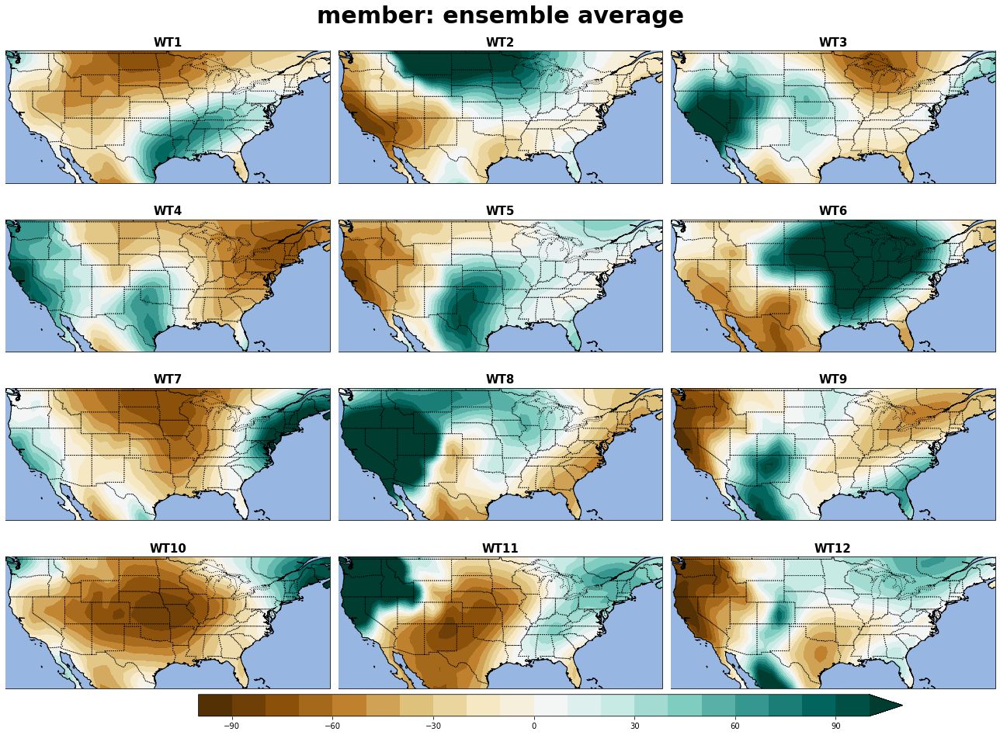

In [15]:
flnm_cli = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_clim_large.nc'
with  xr.open_dataset(flnm_cli) as ds_cli:
    prec_cli = ds_cli.PRECT

n_lat = prec_cli.shape[0]
n_lon = prec_cli.shape[1]

for mem in range(1, n_mem+1,1):
    mem_s = str(mem).zfill(2)
    flnm_wt = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_' + mem_s + '.nc'
    #print(flnm_wt)
    
    with  xr.open_dataset(flnm_wt) as ds_prec:
        prec_wt = ds_prec.__xarray_dataarray_variable__
        if mem == 1:
            prec_avg = prec_wt.copy()
        else:
            prec_avg = prec_avg + prec_wt

prec_avg = (prec_avg*0.05 - prec_cli)/prec_cli*100
plot_prec_12(prec_avg, -100, 100, 21, 'BrBG', 'horizontal', 'ensemble average')

#### for each ensemble member

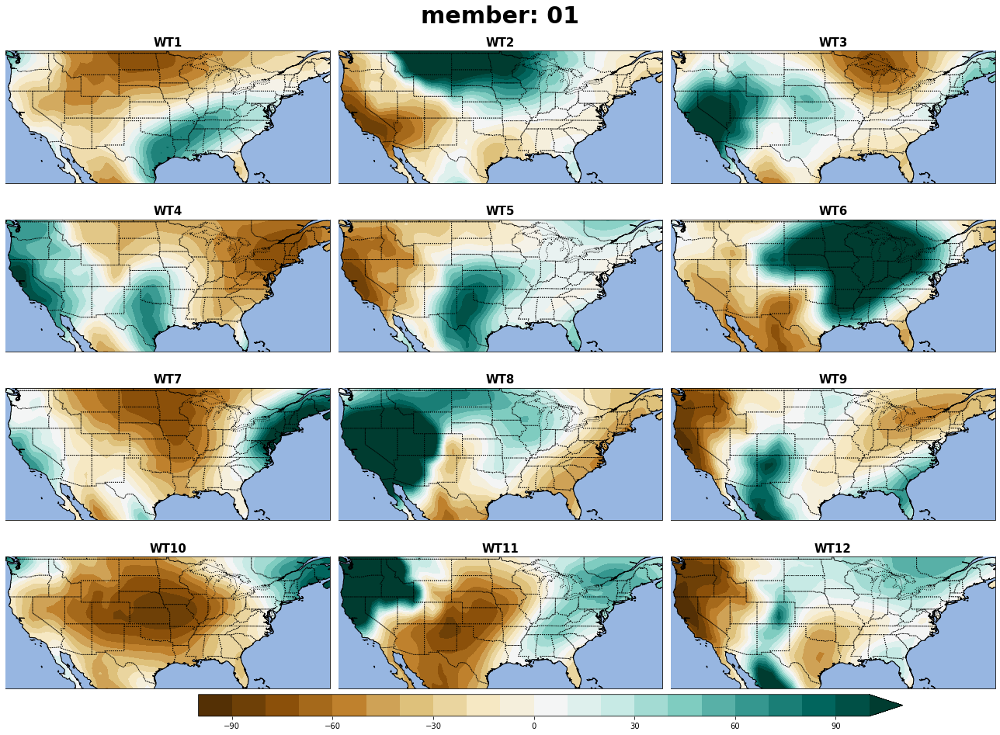

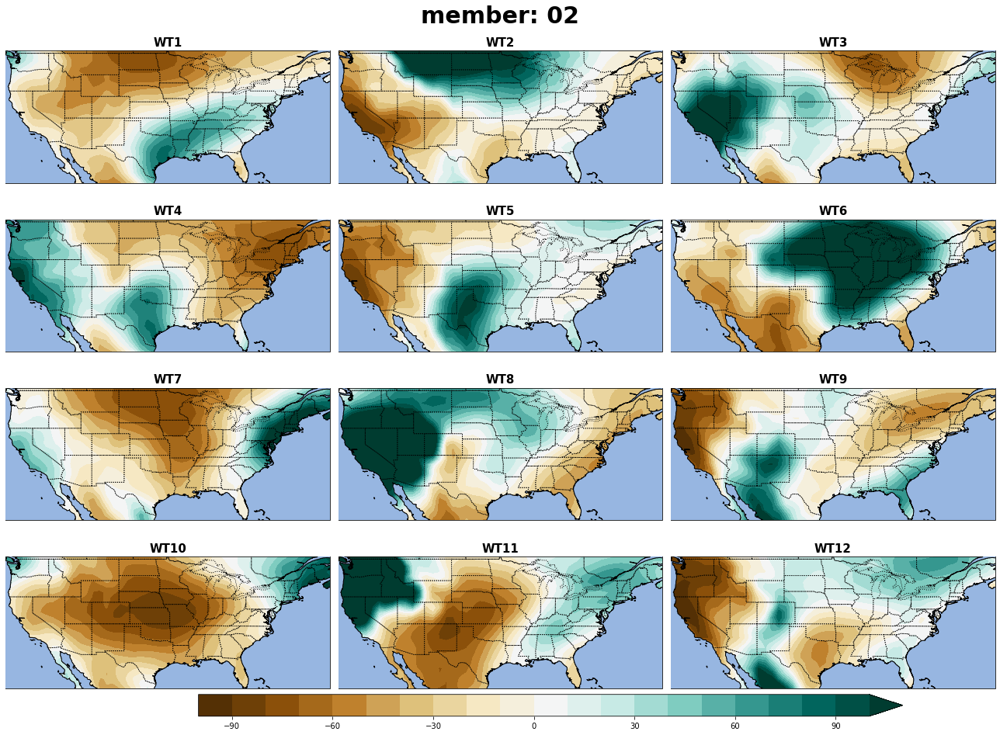

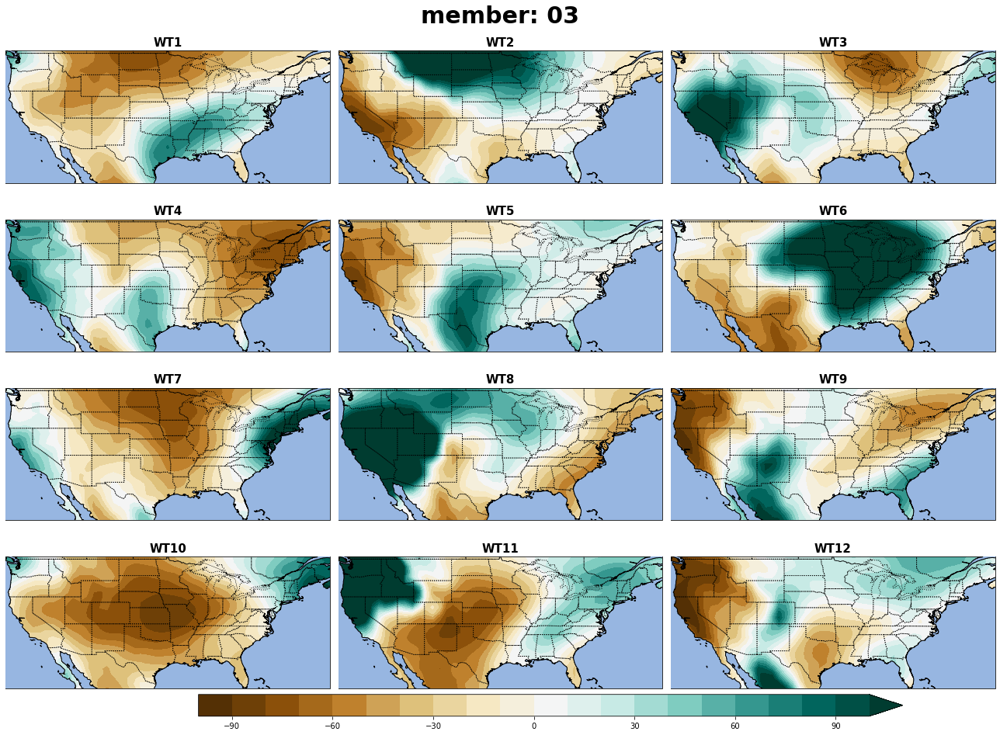

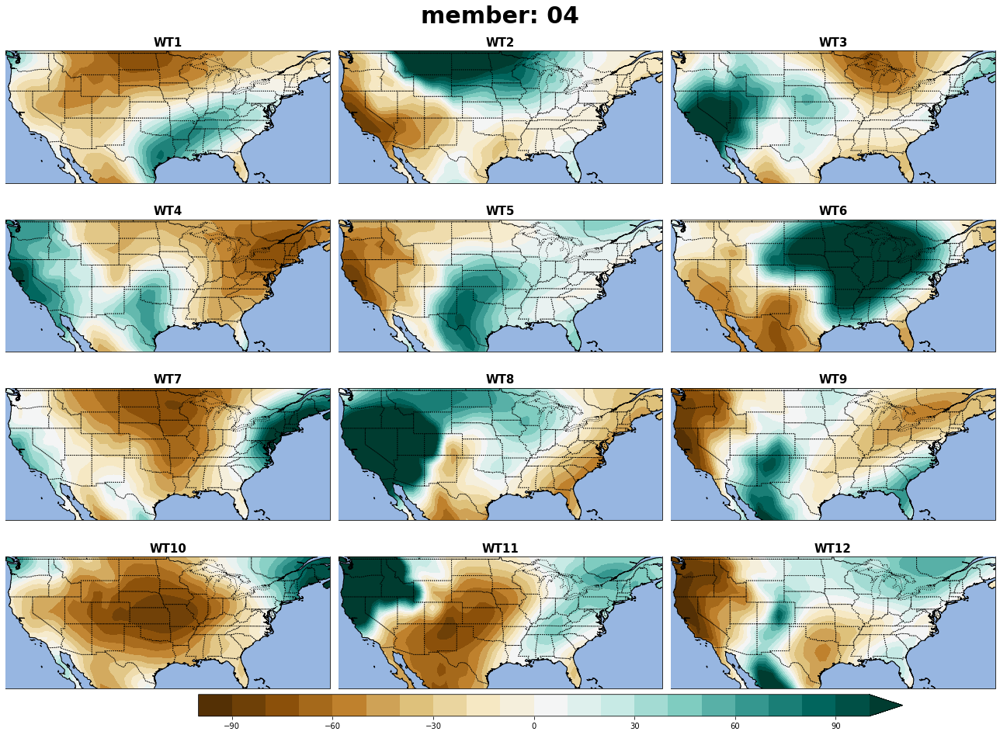

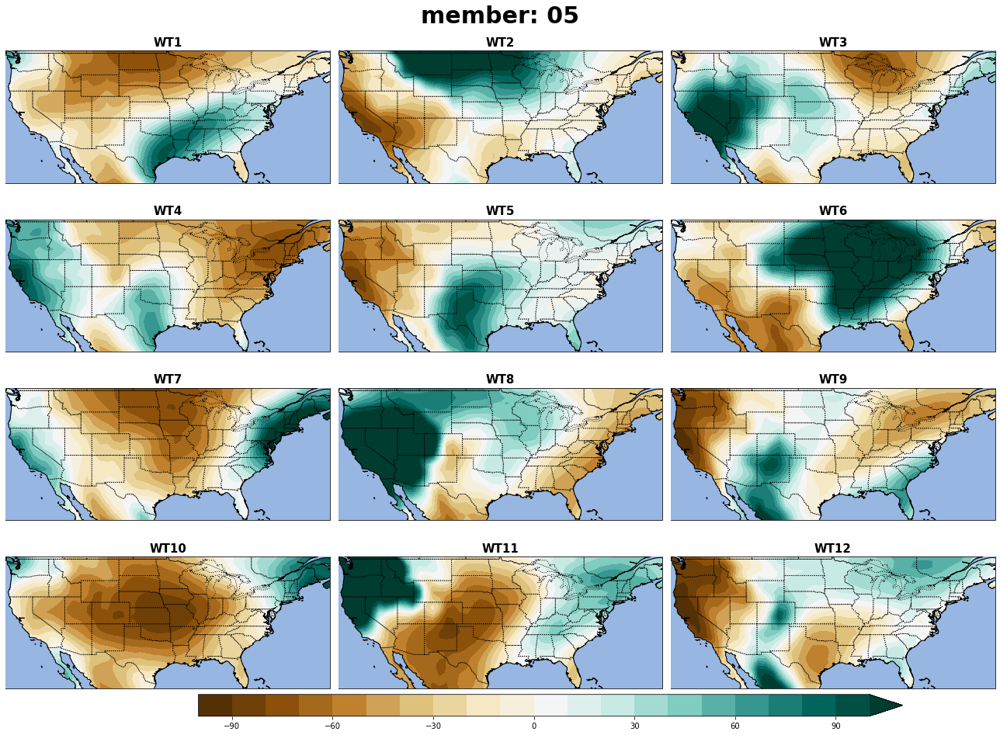

...

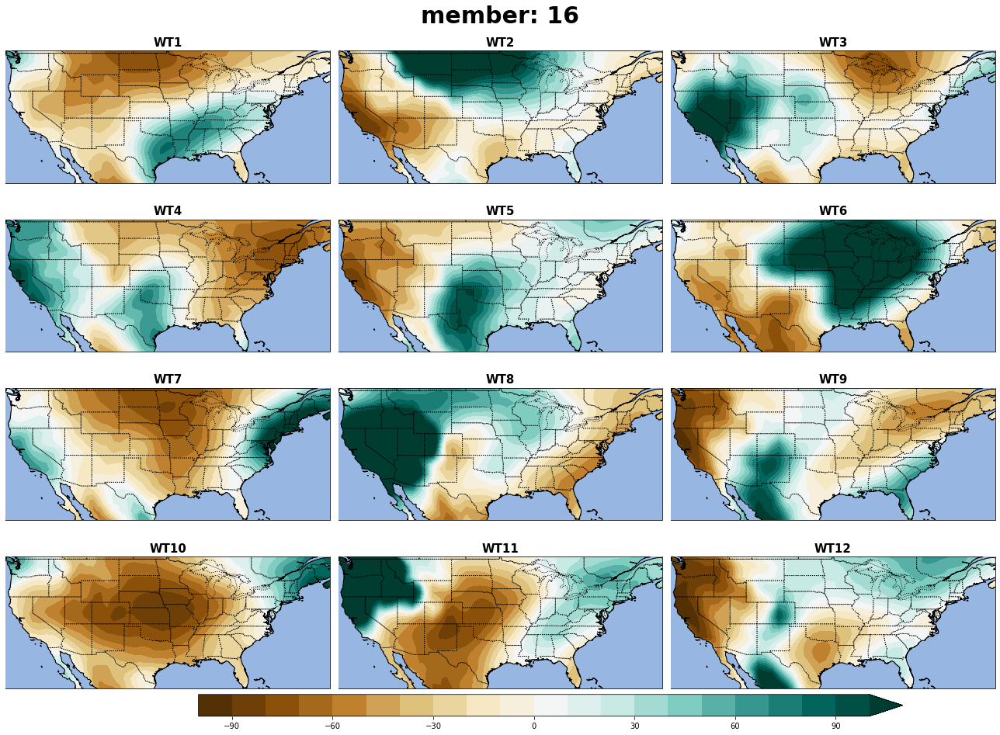

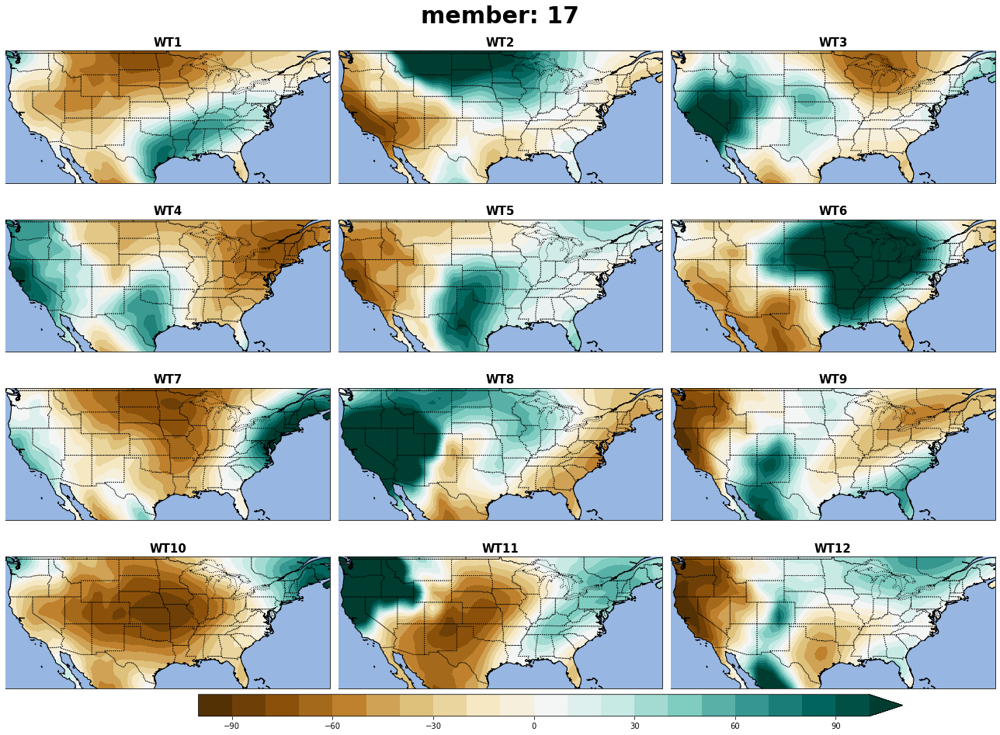

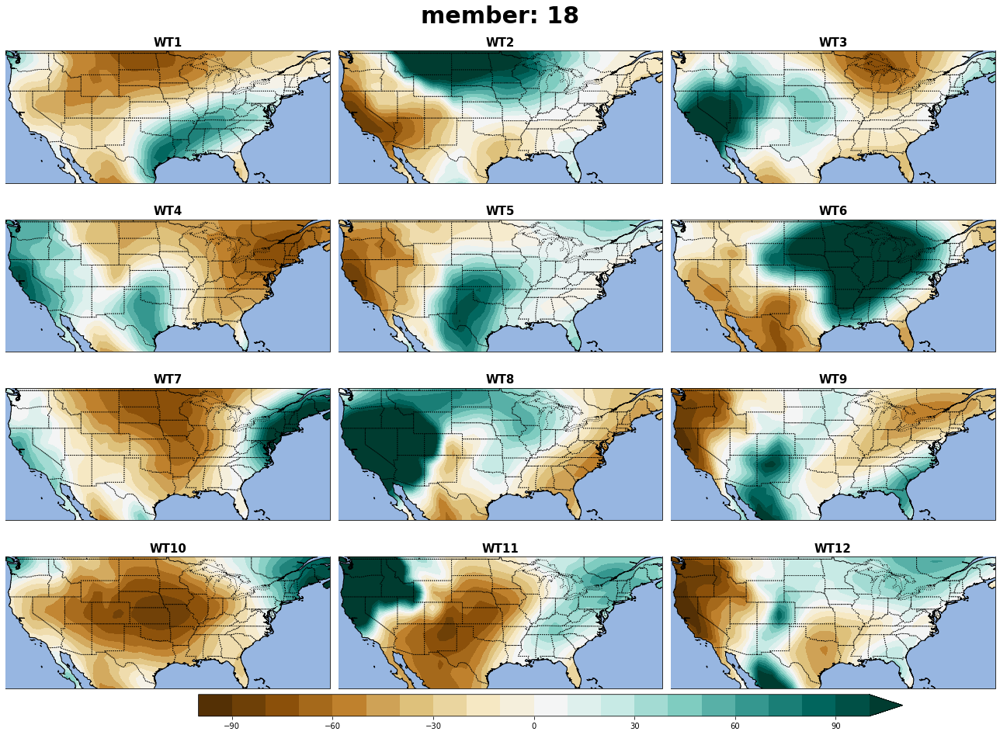

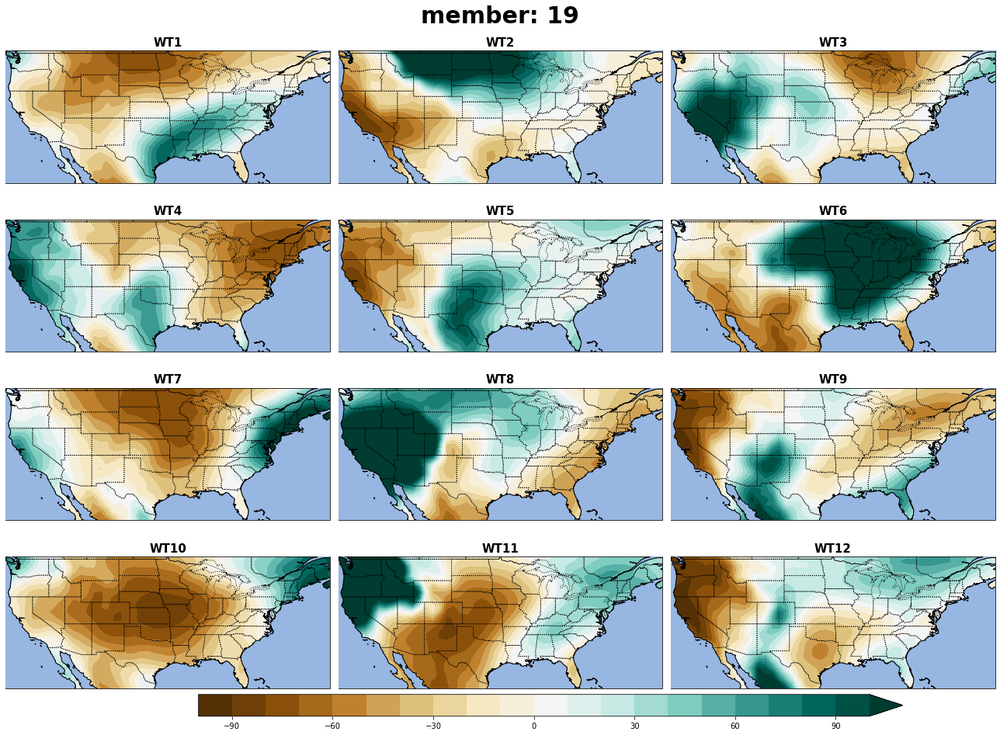

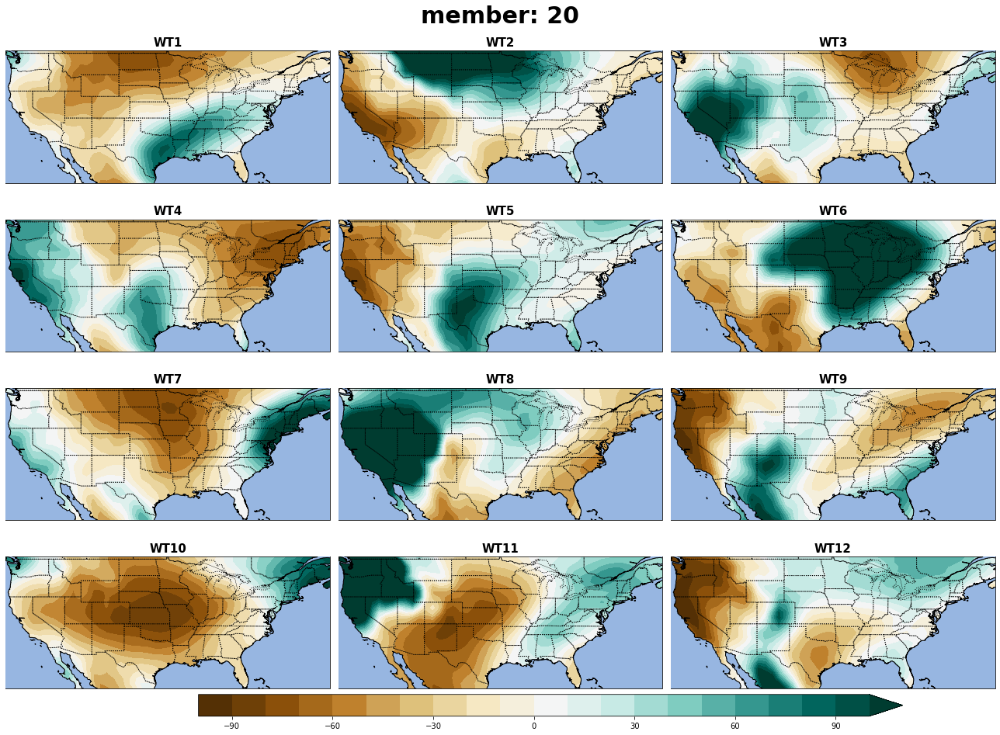

In [16]:
for mem in range(1, n_mem+1,1):
    mem_s = str(mem).zfill(2)
    flnm_wt = '/glade/campaign/mmm/c3we/mingge/COEXIST/SMYLE/prec_wt_' + mem_s + '.nc'
    #print(flnm_wt)
    
    with  xr.open_dataset(flnm_wt) as ds_prec:
        prec_wt = ds_prec.__xarray_dataarray_variable__
         
        prec_avg = (prec_wt - prec_cli)/prec_cli*100
        plot_prec_12(prec_avg, -100, 100, 21, 'BrBG', 'horizontal', mem_s)